<a href="https://colab.research.google.com/github/abdurrahmanshidiq/IBM-Capstone-Project/blob/master/Cluster_Explore_Venues.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


from bs4 import BeautifulSoup
import requests
import json
from pandas import json_normalize

from geopy.geocoders import Nominatim
import folium

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.cluster import KMeans

import string

# from google.colab import drive
# drive.mount('/content/drive')

# Scrapping Kecamatan & Kelurahan at Jakarta Selatan

In [2]:
url = 'https://id.wikipedia.org/wiki/Daftar_kecamatan_dan_kelurahan_di_Kota_Administrasi_Jakarta_Selatan'
raw = requests.get(url).text

soup = BeautifulSoup(raw, 'html5lib')
len(soup.find('table'))

4

In [3]:
#table
table = soup.find_all('table')[0].tbody.find_all('td')
table

[<td>31.74.06
 </td>,
 <td><a href="/wiki/Cilandak,_Jakarta_Selatan" title="Cilandak, Jakarta Selatan">Cilandak</a></td>,
 <td align="center">5</td>,
 <td><div class="hlist">
 <ul><li><a href="/wiki/Cilandak_Barat,_Cilandak,_Jakarta_Selatan" title="Cilandak Barat, Cilandak, Jakarta Selatan">Cilandak Barat</a></li>
 <li><a href="/wiki/Cipete_Selatan,_Cilandak,_Jakarta_Selatan" title="Cipete Selatan, Cilandak, Jakarta Selatan">Cipete Selatan</a></li>
 <li><a href="/wiki/Gandaria_Selatan,_Cilandak,_Jakarta_Selatan" title="Gandaria Selatan, Cilandak, Jakarta Selatan">Gandaria Selatan</a></li>
 <li><a href="/wiki/Lebak_Bulus,_Cilandak,_Jakarta_Selatan" title="Lebak Bulus, Cilandak, Jakarta Selatan">Lebak Bulus</a></li>
 <li><a href="/wiki/Pondok_Labu,_Cilandak,_Jakarta_Selatan" title="Pondok Labu, Cilandak, Jakarta Selatan">Pondok Labu</a></li></ul>
 </div>
 </td>,
 <td>31.74.09
 </td>,
 <td><a href="/wiki/Jagakarsa,_Jakarta_Selatan" title="Jagakarsa, Jakarta Selatan">Jagakarsa</a></td>,
 <

In [4]:
len(table)

40

In [5]:
# #############
# # Kecamatan #
# #############
# kecamatan = []
# for t in np.arange(1,len(table),4):
#   kecamatan.append(table[t].text)

# #############
# # Kelurahan #
# #############
# kelurahan = []
# for t in np.arange(3,len(table),4):
#   kelurahan.append(table[t].text.split('\n')[1:-2])

# ########################
# # Kelurahan & Kecamtan #
# ########################
# for kel in range(len(kelurahan)):
#   print(kelurahan[kel])
#   print()
#   for k in range(len(kelurahan[kel])):
#     print(kelurahan[kel][k])
#     print(kecamatan[kel])
#   print()


In [6]:

kecamatan = []
kelurahan = []

district = []
sub_district = []

for t in np.arange(1,len(table),4):
  kecamatan.append(table[t].text)

for t in np.arange(3,len(table),4):
  kelurahan.append(table[t].text.split('\n')[1:-2])

for kel in range(len(kelurahan)):
  for k in range(len(kelurahan[kel])):
    sub_district.append(kelurahan[kel][k])
    district.append(kecamatan[kel])


In [7]:
df_jaksel = pd.DataFrame({'District':district, 'Sub District':sub_district})
df_jaksel

,District,Sub District
0,Cilandak,Cilandak Barat
1,Cilandak,Cipete Selatan
2,Cilandak,Gandaria Selatan
3,Cilandak,Lebak Bulus
4,Cilandak,Pondok Labu
...,...,...
60,Tebet,Manggarai Selatan
61,Tebet,Manggarai
62,Tebet,Menteng Dalam
63,Tebet,Tebet Barat


### Getting Coordinate for each location

In [8]:
# example
# get coordinate location for Gandaria Selatan, Cilandak 
add = df_jaksel.iloc[2,1]+', '+df_jaksel.iloc[2,0]
address = add

geolocator = Nominatim(user_agent='jaksel_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

detail_loc = location.raw

print('Geographical coordinate of {} are : {}, {}'.format(add, latitude, longitude))

Geographical coordinate of Gandaria Selatan, Cilandak are : -6.271561500000001, 106.79517171144688


In [9]:
# Create Function to get coordinate for each neighborhood

def get_coordinate(district, sub_district):
  lat = []
  lon = []

  for b, n in zip(district, sub_district):
    address = n+', '+b
    geolocator = Nominatim(user_agent='jaksel_explorer')
    location = geolocator.geocode(address)
    lat.append(location.latitude)
    lon.append(location.longitude)

  res = [lat, lon]
  return res

In [10]:
lat_lon_jaksel = get_coordinate(df_jaksel['District'], df_jaksel['Sub District'])

In [11]:
df_jaksel['Latitude'] = lat_lon_jaksel[0]
df_jaksel['Longitude'] = lat_lon_jaksel[1]
df_jaksel.head()

,District,Sub District,Latitude,Longitude
0,Cilandak,Cilandak Barat,-6.290266,106.796215
1,Cilandak,Cipete Selatan,-6.272540,106.805768
2,Cilandak,Gandaria Selatan,-6.271562,106.795172
3,Cilandak,Lebak Bulus,-6.302568,106.780354
4,Cilandak,Pondok Labu,-6.309144,106.797938


### Visualizing Jakarta-Selatan Map

In [12]:
# Getting Coordinate for South Jakarta City (Jakarta Selatan)

address = 'Jakarta Selatan, Jakarta'

geolocator = Nominatim(user_agent='jaksel_explorer')
location = geolocator.geocode(address)
latitude_jaksel = location.latitude
longitude_jaksel = location.longitude

detail_loc = location.raw

print('Geographical coordinate of Jakarta Selatan are {}, {}'.format(latitude, longitude))

Geographical coordinate of Jakarta Selatan are -6.271561500000001, 106.79517171144688


In [13]:
#detail location from geopy
detail_loc

{'boundingbox': ['-6.3650478', '-6.202639', '106.737454', '106.8669728'],
 'class': 'boundary',
 'display_name': 'Jakarta Selatan, Daerah Khusus Ibukota Jakarta, Indonesia',
 'icon': 'https://nominatim.openstreetmap.org/ui/mapicons//poi_boundary_administrative.p.20.png',
 'importance': 0.7308262803545433,
 'lat': '-6.28381815',
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'lon': '106.80486324917382',
 'osm_id': 5802438,
 'osm_type': 'relation',
 'place_id': 310724455,
 'type': 'administrative'}

In [14]:
# Display Neighborhoods in South Jakarta (Jakarta Selatan) Map

map_jaksel = folium.Map(location=[latitude, longitude], zoom_start=12)

for lat, lon, district, sub_district in zip(df_jaksel['Latitude'], df_jaksel['Longitude'], df_jaksel['District'], df_jaksel['Sub District']):
  label = '{}, {}'.format(district, sub_district)
  label = folium.Popup(label, parse_html=True)
  folium.CircleMarker([lat,lon], radius=5, popup=label, color='blue',
                      fill=True, fill_color='#3186cc',
                      fill_opacity=0.5, parse_html=False).add_to(map_jaksel)

map_jaksel

# Utilize Foursquare API

Using `explore` Endpoints. This endpoint will returns a list of ***recommended venues*** near the current location.

https://developer.foursquare.com/docs/api-reference/venues/explore/



In [15]:
CLIENT_ID = '3UT2CP1TASOWFFEBJL3DGSHWTXORPEA5H1UQLX02M3HGHDS1' # your Foursquare ID
CLIENT_SECRET = 'P4N2G2HR4TKTXLDEEVUT1EWROXQ3ZSRHO1TFGGZ2JAWKEDIS' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value
radius = 500 # 500 meters

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3UT2CP1TASOWFFEBJL3DGSHWTXORPEA5H1UQLX02M3HGHDS1
CLIENT_SECRET:P4N2G2HR4TKTXLDEEVUT1EWROXQ3ZSRHO1TFGGZ2JAWKEDIS


In [16]:
# Create Function to extract recommendation venues 

def getNearbyVenues(names, latitudes, longitudes, radius=1000, limit=100):
  neigh_name = []
  neigh_lat = []
  neigh_lon = []
  venue_name = []
  venue_lat = []
  venue_lon = []
  venue_cat_name = []
  print('Neighborhoods in South Jakarta : \n')
  for name, lat, lon in zip(names, latitudes, longitudes):
    print(name)

    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET,
                                                                                                                           VERSION, lat, lon,
                                                                                                                           radius, LIMIT)
    results = requests.get(url).json()['response']['groups'][0]['items']

    for val in results:
      if len(val)<1:
        pass
      else:
        neigh_name.append(name)
        neigh_lat.append(lat)
        neigh_lon.append(lon)
        venue_name.append(val['venue']['name'])
        venue_lat.append(val['venue']['location']['lat'])
        venue_lon.append(val['venue']['location']['lng'])
        venue_cat_name.append(val['venue']['categories'][0]['name'])


  nearby_venue = pd.DataFrame({'Sub District':neigh_name, 'Sub District Latitude':neigh_lat, 'Sub District Longitude':neigh_lon, 
                               'Venue':venue_name, 'Venue Latitude':venue_lat, 'Venue Longitude':venue_lon, 'Venue Category':venue_cat_name})
  return nearby_venue

In [17]:
df_jaksel_explore_venues = getNearbyVenues(df_jaksel['Sub District'], df_jaksel['Latitude'],
                                   df_jaksel['Longitude'])

Neighborhoods in South Jakarta : 

Cilandak Barat
Cipete Selatan
Gandaria Selatan
Lebak Bulus
Pondok Labu
Ciganjur
Cipedak
Jagakarsa
Lenteng Agung
Srengseng Sawah
Tanjung Barat
Cipete Utara
Gandaria Utara
Gunung
Kramat Pela
Melawai
Petogogan
Pulo
Rawa Barat
Selong
Senayan
Cipulir
Grogol Selatan
Grogol Utara
Kebayoran Lama Selatan
Kebayoran Lama Utara
Pondok Pinang
Bangka
Kuningan Barat
Mampang Prapatan
Pela Mampang
Tegal Parang
Cikoko
Duren Tiga
Kalibata
Pancoran
Pengadegan
Rawajati
Cilandak Timur
Jati Padang
Kebagusan
Pasar Minggu
Pejaten Barat
Pejaten Timur
Ragunan
Bintaro
Pesanggrahan
Petukangan Selatan
Petukangan Utara
Ulujami
Guntur
Karet Kuningan
Karet Semanggi
Karet
Kuningan Timur
Menteng Atas
Pasar Manggis
Setiabudi
Bukit Duri
Kebon Baru
Manggarai Selatan
Manggarai
Menteng Dalam
Tebet Barat
Tebet Timur


In [18]:
df_jaksel_explore_venues

,Sub District,Sub District Latitude,Sub District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Cilandak Barat,-6.290266,106.796215,Total Buah Segar,-6.287626,106.795414,Farmers Market
1,Cilandak Barat,-6.290266,106.796215,TOUS les JOURS,-6.291655,106.799730,Bakery
2,Cilandak Barat,-6.290266,106.796215,Bebek Tepi Sawah,-6.291700,106.799664,Asian Restaurant
3,Cilandak Barat,-6.290266,106.796215,Holycow! Steakhouse,-6.291588,106.800923,Steakhouse
4,Cilandak Barat,-6.290266,106.796215,LEGO Store,-6.291685,106.799760,Toy / Game Store
...,...,...,...,...,...,...,...
3925,Tebet Timur,-6.226016,106.858396,KFC,-6.224750,106.866890,Fast Food Restaurant
3926,Tebet Timur,-6.226016,106.858396,Kedai Mamak,-6.234019,106.856831,Indonesian Restaurant
3927,Tebet Timur,-6.226016,106.858396,STABET - Nasi Jamblang Tulen,-6.225971,106.858070,Restaurant
3928,Tebet Timur,-6.226016,106.858396,Stasiun Tebet,-6.226205,106.858387,Train Station


In [19]:
# Checking null values
df_jaksel_explore_venues.isnull().sum()

Sub District              0
Sub District Latitude     0
Sub District Longitude    0
Venue                     0
Venue Latitude            0
Venue Longitude           0
Venue Category            0
dtype: int64

In [20]:
df_jaksel_explore_venues[df_jaksel_explore_venues['Venue Category']=='Office']

,Sub District,Sub District Latitude,Sub District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
196,Gandaria Selatan,-6.271562,106.795172,Pusat Niaga Duta Mas Fatmawati,-6.263460,106.798740,Office
1799,Kuningan Barat,-6.234131,106.820439,City Plaza,-6.235667,106.823179,Office
1842,Kuningan Barat,-6.234131,106.820439,Graha Intikom,-6.238431,106.825354,Office
1891,Mampang Prapatan,-6.242706,106.829288,Graha Intikom,-6.238431,106.825354,Office
1925,Mampang Prapatan,-6.242706,106.829288,Telkomsel IT,-6.235828,106.823539,Office
2505,Bintaro,-6.271393,106.760862,Snappy Bintaro,-6.272268,106.753064,Office
3034,Kuningan Timur,-6.232337,106.828939,City Plaza,-6.235667,106.823179,Office
3071,Kuningan Timur,-6.232337,106.828939,Graha Intikom,-6.238431,106.825354,Office


In [21]:
#Top 10 Neighborhood with number of venues
df_jaksel_explore_venues.groupby('Sub District').count().reset_index()[['Sub District','Venue']].sort_values('Venue', ascending=False).head(10)

,Sub District,Venue
0,Bangka,100
30,Kuningan Timur,100
22,Karet Kuningan,100
23,Karet Semanggi,100
25,Kebayoran Lama Selatan,100
26,Kebayoran Lama Utara,100
28,Kramat Pela,100
58,Setiabudi,100
35,Manggarai Selatan,100
17,Gunung,100


In [22]:
#Bottom 10 Neighborhood with number of venues
df_jaksel_explore_venues.groupby('Sub District').count().reset_index()[['Sub District','Venue']].sort_values('Venue', ascending=False).tail(10)

,Sub District,Venue
60,Tanjung Barat,19
63,Tegal Parang,18
24,Kebagusan,17
32,Lenteng Agung,15
18,Jagakarsa,15
10,Cipulir,14
64,Ulujami,14
46,Pesanggrahan,11
7,Cipedak,9
3,Ciganjur,5


In [23]:
print('There are {} uniques venue categories in Jakarta Selatan.'.format(len(df_jaksel_explore_venues['Venue Category'].unique())))

There are 230 uniques venue categories in Jakarta Selatan.


In [24]:
map_explore_venue_jaksel = folium.Map(location=[latitude_jaksel, longitude_jaksel], zoom_start=12)

for lat, lon, venue, cat in zip(df_jaksel_explore_venues['Venue Latitude'], df_jaksel_explore_venues['Venue Longitude'], 
                                df_jaksel_explore_venues['Venue'],df_jaksel_explore_venues['Venue Category']):
  label = '{}\n\n category: {}'.format(venue, cat)
  label = folium.Popup(label, parse_html=True)
  folium.CircleMarker([lat,lon], radius=5, popup=label, color='blue',
                      fill=True, fill_color='#3186cc',
                      fill_opacity=0.5, parse_html=False).add_to(map_explore_venue_jaksel)

map_explore_venue_jaksel

### Get Dummies for exlored `Venue Category`

In [25]:
print(df_jaksel_explore_venues.shape)
df_jaksel_explore_venues.head()

(3930, 7)


,Sub District,Sub District Latitude,Sub District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Cilandak Barat,-6.290266,106.796215,Total Buah Segar,-6.287626,106.795414,Farmers Market
1,Cilandak Barat,-6.290266,106.796215,TOUS les JOURS,-6.291655,106.799730,Bakery
2,Cilandak Barat,-6.290266,106.796215,Bebek Tepi Sawah,-6.291700,106.799664,Asian Restaurant
3,Cilandak Barat,-6.290266,106.796215,Holycow! Steakhouse,-6.291588,106.800923,Steakhouse
4,Cilandak Barat,-6.290266,106.796215,LEGO Store,-6.291685,106.799760,Toy / Game Store


In [26]:
explore_venues_onehot = pd.get_dummies(df_jaksel_explore_venues[['Venue Category']], prefix='', prefix_sep='')

# add Sub District column back to dataframe
explore_venues_onehot['Sub District'] = df_jaksel_explore_venues['Sub District'] 

# move Sub District column to the first column
fixed_columns = [explore_venues_onehot.columns[-1]] + list(explore_venues_onehot.columns[:-1])
explore_venues_onehot = explore_venues_onehot[fixed_columns]

explore_venues_onehot

,Sub District,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Cilandak Barat,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Cilandak Barat,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [27]:
# let's group rows by Sub District and by taking the mean of the frequency of occurrence of each category
explore_venues_grouped = explore_venues_onehot.groupby('Sub District').mean().reset_index()
explore_venues_grouped

,Sub District,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.000000,0.01,0.000000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,

In [28]:
# Let's print each Sub District along with the top 10 most common venues

num_top_venues = 10

for subdis in explore_venues_grouped['Sub District']:
    print("----"+subdis+"----")
    temp = explore_venues_grouped[explore_venues_grouped['Sub District'] == subdis].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bangka----
                 venue  freq
0          Coffee Shop  0.14
1           Restaurant  0.06
2          Pizza Place  0.05
3  American Restaurant  0.03
4   Chinese Restaurant  0.03
5                 Café  0.03
6   Italian Restaurant  0.03
7           Playground  0.02
8               Bistro  0.02
9  Japanese Restaurant  0.02


----Bintaro----
                   venue  freq
0            Coffee Shop  0.09
1  Indonesian Restaurant  0.09
2      Convenience Store  0.09
3   Fast Food Restaurant  0.07
4             Restaurant  0.07
5             Food Truck  0.07
6           Burger Joint  0.05
7                    Gym  0.05
8     Salon / Barbershop  0.04
9       Asian Restaurant  0.04


----Bukit Duri----
                       venue  freq
0      Indonesian Restaurant  0.15
1          Convenience Store  0.09
2                       Café  0.06
3           Asian Restaurant  0.06
4                Coffee Shop  0.05
5                     Bakery  0.04
6                 Restaurant  0.03
7     

In [29]:
# First, let's write a function to sort the venues in descending order.

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [30]:
num_top_venues = 10 # Number of top 5 venues occurence/appearence

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Sub District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
subdistrict_explore_venues_sorted = pd.DataFrame(columns=columns)
subdistrict_explore_venues_sorted['Sub District'] = explore_venues_grouped['Sub District']

for ind in np.arange(explore_venues_grouped.shape[0]):
    subdistrict_explore_venues_sorted.iloc[ind, 1:] = return_most_common_venues(explore_venues_grouped.iloc[ind, :], num_top_venues)


In [31]:
# Top 5 appearences Venues for each Sub District (giving by `explore` endpoint)
subdistrict_explore_venues_sorted

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bangka,Coffee Shop,Restaurant,Pizza Place,Italian Restaurant,Chinese Restaurant,American Restaurant,Café,Japanese Restaurant,Pub,Plaza
1,Bintaro,Coffee Shop,Indonesian Restaurant,Convenience Store,Food Truck,Fast Food Restaurant,Restaurant,Burger Joint,Gym,Asian Restaurant,Café
2,Bukit Duri,Indonesian Restaurant,Convenience Store,Asian Restaurant,Café,Coffee Shop,Bakery,Clothing Store,Karaoke Bar,Restaurant,Indonesian Meatball Place
3,Ciganjur,Arcade,Soccer Stadium,Convenience Store,Café,Park,Yoga Studio,Flea Market,Fruit & Vegetable Store,Frozen Yogurt Shop,Fried Chicken Joint
4,Cikoko,Convenience Store,Asian Restaurant,Coffee Shop,Food Truck,Supermarket,Park,Café,Chinese Restaurant,Fast Food Restaurant,Noodle House
...,...,...,...,...,...,...,...,...,...,...,...
60,Tanjung Barat,Coffee Shop,Indonesian Restaurant,Javanese Restaurant,Fast Food Restaurant,Buffet,Hotel,Grocery Store,Gourmet Shop,Noodle House,Donut Shop
61,Tebet Barat,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery
62,Tebet Timur,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery
63,Tegal Parang,Asian Restaurant,Food Truck,Fast Food Restaurant,Bakery,Coffee Shop,Middle Eastern Restaurant,Market,Salon / Barbershop,Indonesian Restaurant,Vape Store


# Clustering Sub District by Venue Categories

In [32]:
explore_venues_grouped

,Sub District,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.000000,0.01,0.000000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,

## Utilizing Elbow Method for finding the most optimum number of clusters

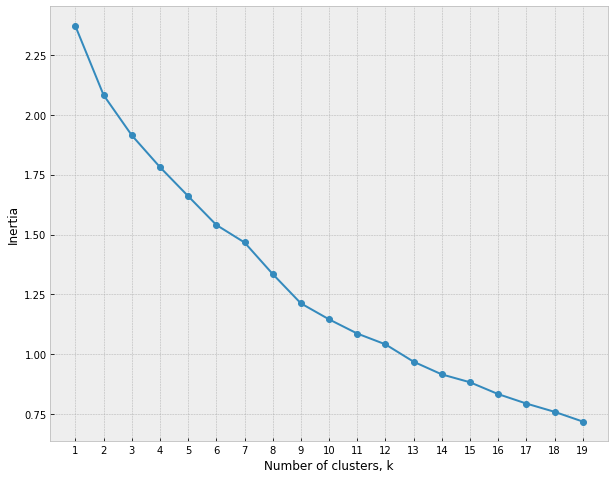

In [33]:
kclusters = range(1,20)
inertias=[]
for k in kclusters:
    model = KMeans(n_clusters=k)
    model.fit(explore_venues_grouped.drop('Sub District',1))
    inertias.append(model.inertia_)


plt.figure(figsize=(10,8)) 
plt.style.use('bmh')
plt.plot(kclusters, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(kclusters)
plt.show()

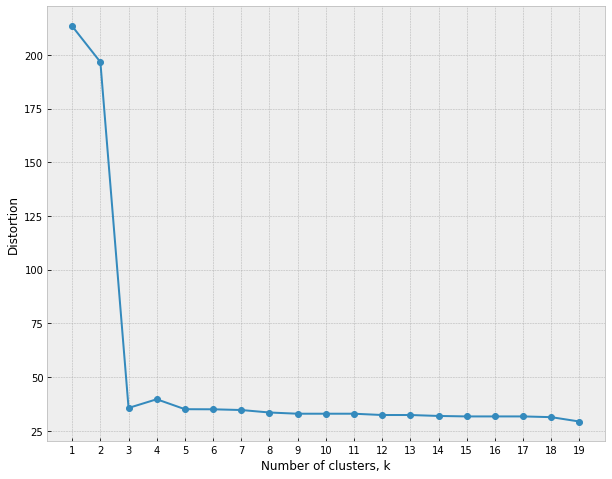

In [34]:
from scipy.spatial.distance import cdist

kclusters = range(1,20)
distortion=[]

for k in kclusters:
    model = KMeans(n_clusters=k, random_state=0)
    model.fit(explore_venues_grouped.drop('Sub District',1))
    distortion.append(sum(np.min(cdist(explore_venues_grouped.drop('Sub District',1), 
                                       model.cluster_centers_,'canberra'), axis=1)) / explore_venues_grouped.drop('Sub District',1).shape[0])


plt.figure(figsize=(10,8)) 
plt.style.use('bmh')
plt.plot(kclusters, distortion, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Distortion')
plt.xticks(kclusters)
plt.show()


Based on graphic above, we'll choose 5 as number of clusters

In [35]:
explore_venues_grouped

,Sub District,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.000000,0.01,0.000000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,

In [36]:
# set number of clusters
kclusters = 5

explore_venues_grouped_clustering = explore_venues_grouped.drop('Sub District', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(explore_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([3, 0, 0, 4, 0, 0, 3, 2, 0, 3, 1, 0, 0, 3, 3, 0, 3, 0, 0, 1, 3, 3,
       3, 3, 3, 3, 3, 0, 3, 3, 3, 0, 1, 3, 1, 0, 3, 3, 0, 0, 1, 1, 0, 1,
       3, 0, 3, 3, 1, 1, 3, 0, 3, 0, 3, 0, 3, 3, 3, 1, 3, 0, 0, 1, 1],
      dtype=int32)

In [37]:
# Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

# add clustering labels
subdistrict_explore_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [38]:
jaksel_cluster_explore_venues = df_jaksel

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
jaksel_cluster_explore_venues = jaksel_cluster_explore_venues.join(subdistrict_explore_venues_sorted.set_index('Sub District'), on='Sub District')

jaksel_cluster_explore_venues # check the last columns!

,District,Sub District,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,0,Indonesian Restaurant,Asian Restaurant,Coffee Shop,Café,Convenience Store,Gym,Food Truck,Chinese Restaurant,French Restaurant,Ice Cream Shop
1,Cilandak,Cipete Selatan,-6.272540,106.805768,0,Coffee Shop,Food Truck,Café,Noodle House,Indonesian Restaurant,Convenience Store,Asian Restaurant,Bakery,Padangnese Restaurant,Restaurant
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,0,Food Truck,Convenience Store,Indonesian Restaurant,Coffee Shop,Padangnese Restaurant,Bakery,Seafood Restaurant,Fast Food Restaurant,Music Venue,Motorcycle Shop
3,Cilandak,Lebak Bulus,-6.302568,106.780354,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Seafood Restaurant,Food Truck,Café,Restaurant,Soup Place,Food Court,Garden
4,Cilandak,Pondok Labu,-6.309144,106.797938,3,Coffee Shop,Grocery Store,Indonesian Restaurant,Café,Movie Theater,Javanese Restaurant,Food Truck,Food Court,Art Museum,Shopping Mall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery
61,Tebet,Manggarai,-6.210134,106.850058,1,Coffee Shop,Food Truck,Fast Food Restaurant,Park,Arcade,Pizza Place,Betawinese Restaurant,Asian Restaurant,Train Station,Grocery Store
62,Tebet,Menteng Dalam,-6.232051,106.840997,0,Indonesian Restaurant,Convenience Store,Coffee Shop,Café,Hotel,Restaurant,Food Truck,Japanese Restaurant,Pharmacy,Noodle House
63,Tebet,Tebet Barat,-6.226016,106.858396,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery


In [39]:
print(jaksel_cluster_explore_venues.shape)

(65, 15)


In [40]:
jaksel_cluster_explore_venues.isnull().sum()

District                  0
Sub District              0
Latitude                  0
Longitude                 0
Cluster Labels            0
1st Most Common Venue     0
2nd Most Common Venue     0
3rd Most Common Venue     0
4th Most Common Venue     0
5th Most Common Venue     0
6th Most Common Venue     0
7th Most Common Venue     0
8th Most Common Venue     0
9th Most Common Venue     0
10th Most Common Venue    0
dtype: int64

In [41]:
# Fisualize clusters

# create map
map_clusters = folium.Map(location=[latitude_jaksel, longitude_jaksel], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(jaksel_cluster_explore_venues['Latitude'], jaksel_cluster_explore_venues['Longitude'], 
                                  jaksel_cluster_explore_venues['Sub District'], jaksel_cluster_explore_venues['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examin Clusters

In [42]:
[c for c in rainbow]

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']

In [43]:
# CLuster 0
# Purple '#8000ff'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==0].iloc[:,[1,5,6,7,8,9]]

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Cilandak Barat,Indonesian Restaurant,Asian Restaurant,Coffee Shop,Café,Convenience Store
1,Cipete Selatan,Coffee Shop,Food Truck,Café,Noodle House,Indonesian Restaurant
2,Gandaria Selatan,Food Truck,Convenience Store,Indonesian Restaurant,Coffee Shop,Padangnese Restaurant
3,Lebak Bulus,Indonesian Restaurant,Convenience Store,Asian Restaurant,Seafood Restaurant,Food Truck
7,Jagakarsa,Asian Restaurant,Acehnese Restaurant,Grocery Store,Indonesian Restaurant,Pharmacy
13,Gunung,Coffee Shop,Convenience Store,Indonesian Restaurant,Food Truck,Café
23,Grogol Utara,Indonesian Restaurant,Coffee Shop,Residential Building (Apartment / Condo),Breakfast Spot,Karaoke Bar
26,Pondok Pinang,Indonesian Restaurant,Coffee Shop,Convenience Store,Fast Food Restaurant,Pizza Place
32,Cikoko,Convenience Store,Asian Restaurant,Coffee Shop,Food Truck,Supermarket
33,Duren Tiga,Convenience Store,Restaurant,Fast Food Restaurant,Steakhouse,Coffee Shop


In [44]:
# CLuster 1
# Blue '#00b5eb'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==1].iloc[:,[1,5,6,7,8,9]]

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
8,Lenteng Agung,Fast Food Restaurant,Food Truck,Acehnese Restaurant,Flea Market,Noodle House
9,Srengseng Sawah,Fast Food Restaurant,Pizza Place,College Residence Hall,Food Truck,Department Store
21,Cipulir,Department Store,Asian Restaurant,Market,Golf Course,Sporting Goods Shop
31,Tegal Parang,Asian Restaurant,Food Truck,Fast Food Restaurant,Bakery,Coffee Shop
39,Jati Padang,Japanese Restaurant,Fast Food Restaurant,Food Truck,Indonesian Restaurant,Food & Drink Shop
41,Pasar Minggu,Convenience Store,Fast Food Restaurant,Asian Restaurant,Food Truck,Indonesian Meatball Place
43,Pejaten Timur,Convenience Store,Fast Food Restaurant,Asian Restaurant,Food Truck,Indonesian Meatball Place
47,Petukangan Selatan,Noodle House,Fast Food Restaurant,Convenience Store,Indonesian Restaurant,Food Truck
48,Petukangan Utara,Fast Food Restaurant,Convenience Store,Food Truck,Noodle House,Electronics Store
49,Ulujami,Department Store,Noodle House,Convenience Store,Clothing Store,Music Venue


In [45]:
# CLuster 2
# Green '#80ffb4'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==2].iloc[:,[1,5,6,7,8,9]]

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
6,Cipedak,Grocery Store,Department Store,Food Truck,Seafood Restaurant,Fast Food Restaurant


In [46]:
# CLuster 3
# Orange '#ffb360'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==3].iloc[:,[1,5,6,7,8,9]]

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,Pondok Labu,Coffee Shop,Grocery Store,Indonesian Restaurant,Café,Movie Theater
10,Tanjung Barat,Coffee Shop,Indonesian Restaurant,Javanese Restaurant,Fast Food Restaurant,Buffet
11,Cipete Utara,Coffee Shop,Hotel,Food Truck,BBQ Joint,American Restaurant
12,Gandaria Utara,Café,Indonesian Restaurant,Coffee Shop,Food Truck,Japanese Restaurant
14,Kramat Pela,Japanese Restaurant,Coffee Shop,Indonesian Restaurant,Food Truck,Noodle House
15,Melawai,Japanese Restaurant,Coffee Shop,BBQ Joint,Asian Restaurant,Restaurant
16,Petogogan,Coffee Shop,Indonesian Restaurant,Asian Restaurant,Restaurant,Food Court
17,Pulo,Coffee Shop,Indonesian Restaurant,Hotel,Japanese Restaurant,BBQ Joint
18,Rawa Barat,Coffee Shop,Japanese Restaurant,Korean Restaurant,Indonesian Restaurant,Asian Restaurant
19,Selong,Japanese Restaurant,Coffee Shop,Indonesian Restaurant,Korean Restaurant,Steakhouse


In [47]:
# CLuster 4
# Red '#ff0000'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==4].iloc[:,[1,5,6,7,8,9]]

,Sub District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
5,Ciganjur,Arcade,Soccer Stadium,Convenience Store,Café,Park


## 1st Most Common Venues Analysis

In [48]:
jaksel_cluster_explore_venues

,District,Sub District,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,0,Indonesian Restaurant,Asian Restaurant,Coffee Shop,Café,Convenience Store,Gym,Food Truck,Chinese Restaurant,French Restaurant,Ice Cream Shop
1,Cilandak,Cipete Selatan,-6.272540,106.805768,0,Coffee Shop,Food Truck,Café,Noodle House,Indonesian Restaurant,Convenience Store,Asian Restaurant,Bakery,Padangnese Restaurant,Restaurant
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,0,Food Truck,Convenience Store,Indonesian Restaurant,Coffee Shop,Padangnese Restaurant,Bakery,Seafood Restaurant,Fast Food Restaurant,Music Venue,Motorcycle Shop
3,Cilandak,Lebak Bulus,-6.302568,106.780354,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Seafood Restaurant,Food Truck,Café,Restaurant,Soup Place,Food Court,Garden
4,Cilandak,Pondok Labu,-6.309144,106.797938,3,Coffee Shop,Grocery Store,Indonesian Restaurant,Café,Movie Theater,Javanese Restaurant,Food Truck,Food Court,Art Museum,Shopping Mall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery
61,Tebet,Manggarai,-6.210134,106.850058,1,Coffee Shop,Food Truck,Fast Food Restaurant,Park,Arcade,Pizza Place,Betawinese Restaurant,Asian Restaurant,Train Station,Grocery Store
62,Tebet,Menteng Dalam,-6.232051,106.840997,0,Indonesian Restaurant,Convenience Store,Coffee Shop,Café,Hotel,Restaurant,Food Truck,Japanese Restaurant,Pharmacy,Noodle House
63,Tebet,Tebet Barat,-6.226016,106.858396,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Karaoke Bar,Restaurant,Seafood Restaurant,Art Gallery


In [49]:
df_cluster = jaksel_cluster_explore_venues.drop(['District', 'Sub District', 'Latitude', 'Longitude'],axis=1)
df_cluster.head()

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,Indonesian Restaurant,Asian Restaurant,Coffee Shop,Café,Convenience Store,Gym,Food Truck,Chinese Restaurant,French Restaurant,Ice Cream Shop
1,0,Coffee Shop,Food Truck,Café,Noodle House,Indonesian Restaurant,Convenience Store,Asian Restaurant,Bakery,Padangnese Restaurant,Restaurant
2,0,Food Truck,Convenience Store,Indonesian Restaurant,Coffee Shop,Padangnese Restaurant,Bakery,Seafood Restaurant,Fast Food Restaurant,Music Venue,Motorcycle Shop
3,0,Indonesian Restaurant,Convenience Store,Asian Restaurant,Seafood Restaurant,Food Truck,Café,Restaurant,Soup Place,Food Court,Garden
4,3,Coffee Shop,Grocery Store,Indonesian Restaurant,Café,Movie Theater,Javanese Restaurant,Food Truck,Food Court,Art Museum,Shopping Mall


In [50]:
count_venue = df_cluster.groupby(['Cluster Labels', '1st Most Common Venue']).size().reset_index(name='Count Venue')
count_venue

,Cluster Labels,1st Most Common Venue,Count Venue
0,0,Asian Restaurant,2
1,0,Coffee Shop,5
2,0,Convenience Store,5
3,0,Food Truck,1
4,0,Indonesian Restaurant,9
5,1,Asian Restaurant,1
6,1,Coffee Shop,1
7,1,Convenience Store,2
8,1,Department Store,2
9,1,Fast Food Restaurant,4


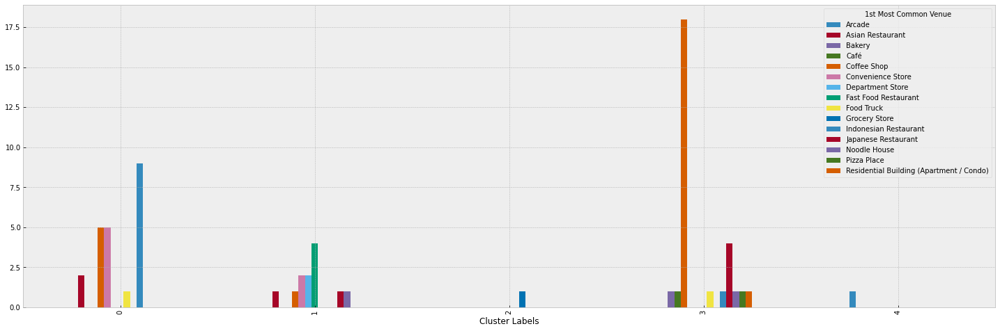

In [51]:
count_venue.pivot(index='Cluster Labels',columns='1st Most Common Venue', values='Count Venue').fillna(0).astype('int').plot(kind='bar', figsize=(25,8))

In [52]:
# top 3 venues per Sub District

top3 = df_jaksel_explore_venues.groupby(['Sub District', 'Venue Category'])['Venue'].count().reset_index(name='Counts')
top3 = top3.sort_values(['Sub District', 'Counts'], ascending=False).groupby('Sub District').head(3).reset_index(drop=True)

top3['Join'] = top3['Counts'].map(str) + " " + top3['Venue Category']
top3

,Sub District,Venue Category,Counts,Join
0,Ulujami,Convenience Store,2,2 Convenience Store
1,Ulujami,Department Store,2,2 Department Store
2,Ulujami,Noodle House,2,2 Noodle House
3,Tegal Parang,Asian Restaurant,3,3 Asian Restaurant
4,Tegal Parang,Fast Food Restaurant,3,3 Fast Food Restaurant
...,...,...,...,...
190,Bintaro,Convenience Store,5,5 Convenience Store
191,Bintaro,Indonesian Restaurant,5,5 Indonesian Restaurant
192,Bangka,Coffee Shop,14,14 Coffee Shop
193,Bangka,Restaurant,6,6 Restaurant


In [53]:
top3 = top3.groupby(['Sub District'])['Join'].apply(", ".join).reset_index()

top3

,Sub District,Join
0,Bangka,"14 Coffee Shop, 6 Restaurant, 5 Pizza Place"
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Indonesi..."
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,..."
3,Ciganjur,"1 Arcade, 1 Café, 1 Convenience Store"
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof..."
...,...,...
60,Tanjung Barat,"3 Coffee Shop, 2 Fast Food Restaurant, 2 Indon..."
61,Tebet Barat,"17 Indonesian Restaurant, 7 Convenience Store,..."
62,Tebet Timur,"17 Indonesian Restaurant, 7 Convenience Store,..."
63,Tegal Parang,"3 Asian Restaurant, 3 Fast Food Restaurant, 3 ..."


In [54]:
df_summary = top3.merge(jaksel_cluster_explore_venues, how='inner', left_on='Sub District', right_on='Sub District').iloc[:,:6]
df_summary 

,Sub District,Join,District,Latitude,Longitude,Cluster Labels
0,Bangka,"14 Coffee Shop, 6 Restaurant, 5 Pizza Place",Mampang Prapatan,-6.264007,106.819292,3
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Indonesi...",Pesanggrahan,-6.271393,106.760862,0
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,0
3,Ciganjur,"1 Arcade, 1 Café, 1 Convenience Store",Jagakarsa,-6.333430,106.807537,4
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0
...,...,...,...,...,...,...
60,Tanjung Barat,"3 Coffee Shop, 2 Fast Food Restaurant, 2 Indon...",Jagakarsa,-6.308478,106.838856,3
61,Tebet Barat,"17 Indonesian Restaurant, 7 Convenience Store,...",Tebet,-6.226016,106.858396,0
62,Tebet Timur,"17 Indonesian Restaurant, 7 Convenience Store,...",Tebet,-6.226016,106.858396,0
63,Tegal Parang,"3 Asian Restaurant, 3 Fast Food Restaurant, 3 ...",Mampang Prapatan,-6.249144,106.829488,1


# COVID DATA

In [55]:
df_covid = pd.read_csv('https://raw.githubusercontent.com/abdurrahmanshidiq/IBM-Capstone-Project/master/Data_Covid19_Jakarta_November_2020.csv')
df_covid

,id_kel,nama_provinsi,nama_kota,nama_kecamatan,nama_kelurahan,suspek,perawatan_rs,isolasi_di_rumah,suspek_meninggal,selesai_isolasi,probable,perawatan_rs.1,isolasi_di_rumah.1,probable_meninggal,selesai_isolasi.1,pelaku_perjalanan,perawatan_rs.2,isolasi_di_rumah.2,selesai_isolasi.2,kontak_erat,isolasi_di_rumah.3,selesai_isolasi.3,discarded,isolasi_di_rumah.4,meninggal,selesai_isolasi.4,positif,dirawat,sembuh,meninggal.1,self_isolation,keterangan
0,3172051003,DKI JAKARTA,JAKARTA UTARA,PADEMANGAN,ANCOL,618,2,58,0,558,4,0,0,0,4,16,0,3,13,844,72,772,10,0,0,10,385,4,359,4,18,NaN
1,3173041007,DKI JAKARTA,JAKARTA BARAT,TAMBORA,ANGKE,628,5,38,2,583,3,0,0,1,2,1,0,0,1,605,18,587,27,0,0,27,227,0,213,4,10,NaN
2,3175041005,DKI JAKARTA,JAKARTA TIMUR,KRAMAT JATI,BALE KAMBANG,422,1,51,1,369,7,0,0,0,7,5,0,0,5,760,65,695,25,0,0,25,240,5,215,3,17,NaN
3,3175031003,DKI JAKARTA,JAKARTA TIMUR,JATINEGARA,BALI MESTER,156,1,9,1,145,2,0,0,0,2,1,0,0,1,311,83,228,7,0,0,7,211,2,200,3,6,NaN
4,3175101006,DKI JAKARTA,JAKARTA TIMUR,CIPAYUNG,BAMBU APUS,789,2,35,1,751,0,0,0,0,0,5,0,0,5,1099,102,997,20,0,0,20,253,12,223,3,15,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,3175011006,DKI JAKARTA,JAKARTA TIMUR,MATRAMAN,UTAN KAYU SELATAN,706,13,35,8,650,2,0,0,0,2,8,0,0,8,1408,227,1181,98,0,0,98,396,2,369,9,16,NaN
265,3175011002,DKI JAKARTA,JAKARTA TIMUR,MATRAMAN,UTAN KAYU UTARA,787,5,242,0,540,4,2,0,0,2,6,0,0,6,1213,206,1007,49,0,0,49,338,1,305,14,18,NaN
266,3171031008,DKI JAKARTA,JAKARTA PUSAT,KEMAYORAN,UTAN PANJANG,541,1,44,2,494,0,0,0,0,0,4,0,0,4,782,48,734,31,0,0,31,355,1,332,10,12,NaN
267,3172021007,DKI JAKARTA,JAKARTA UTARA,TANJUNG PRIOK,WARAKAS,860,1,65,2,792,0,0,0,0,0,12,0,0,12,1326,160,1166,70,0,0,70,472,4,441,8,19,NaN


In [56]:
covid_jaksel = df_covid[df_covid['nama_kota']=='JAKARTA SELATAN'][['id_kel', 'nama_kota', 'nama_kecamatan', 
                                                                   'nama_kelurahan', 'positif']].reset_index(drop=True)
covid_jaksel

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
0,3174031002,JAKARTA SELATAN,MAMPANG PRAPATAN,BANGKA,263
1,3174101002,JAKARTA SELATAN,PESANGGRAHAN,BINTARO,530
2,3174011005,JAKARTA SELATAN,TEBET,BUKIT DURI,297
3,3174091003,JAKARTA SELATAN,JAGAKARSA,CIGANJUR,304
4,3174081006,JAKARTA SELATAN,PANCORAN,CIKOKO,123
...,...,...,...,...,...
60,3174091005,JAKARTA SELATAN,JAGAKARSA,TANJUNG BARAT,388
61,3174011002,JAKARTA SELATAN,TEBET,TEBET BARAT,586
62,3174011001,JAKARTA SELATAN,TEBET,TEBET TIMUR,289
63,3174031004,JAKARTA SELATAN,MAMPANG PRAPATAN,TEGAL PARANG,424


In [57]:
covid_jaksel['nama_kota'] = [string.capwords(r) for r in covid_jaksel['nama_kota']]
covid_jaksel['nama_kecamatan'] = [string.capwords(r) for r in covid_jaksel['nama_kecamatan']]
covid_jaksel['nama_kelurahan'] = [string.capwords(r) for r in covid_jaksel['nama_kelurahan']]

In [58]:
covid_jaksel

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
0,3174031002,Jakarta Selatan,Mampang Prapatan,Bangka,263
1,3174101002,Jakarta Selatan,Pesanggrahan,Bintaro,530
2,3174011005,Jakarta Selatan,Tebet,Bukit Duri,297
3,3174091003,Jakarta Selatan,Jagakarsa,Ciganjur,304
4,3174081006,Jakarta Selatan,Pancoran,Cikoko,123
...,...,...,...,...,...
60,3174091005,Jakarta Selatan,Jagakarsa,Tanjung Barat,388
61,3174011002,Jakarta Selatan,Tebet,Tebet Barat,586
62,3174011001,Jakarta Selatan,Tebet,Tebet Timur,289
63,3174031004,Jakarta Selatan,Mampang Prapatan,Tegal Parang,424


In [59]:
covid_jaksel['positif'].sum()

20992

In [60]:
# Checking Sub District name on `jaksel dataframe` & `covid dataframe`
kelurahan_a = df_jaksel['Sub District'].sort_values().unique()
kelurahan_b = covid_jaksel['nama_kelurahan'].sort_values().unique()
for b in kelurahan_b:
  if b not in kelurahan_a:
    print(b)

Rawa Jati
Setia Budi


In [61]:
covid_jaksel[covid_jaksel['nama_kelurahan']=='Setia Budi']

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
58,3174021001,Jakarta Selatan,Setia Budi,Setia Budi,74


In [62]:
# Fixing the name of Sub District
covid_jaksel.iloc[55,3] = 'Rawajati'
covid_jaksel.iloc[58,3] = 'Setiabudi'

In [63]:
df_covid_jaksel = df_jaksel.merge(covid_jaksel, left_on='Sub District', right_on='nama_kelurahan')    

df_covid_jaksel = df_covid_jaksel[['District','Sub District','Latitude','Longitude','positif']]
df_covid_jaksel

,District,Sub District,Latitude,Longitude,positif
0,Cilandak,Cilandak Barat,-6.290266,106.796215,675
1,Cilandak,Cipete Selatan,-6.272540,106.805768,247
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,230
3,Cilandak,Lebak Bulus,-6.302568,106.780354,576
4,Cilandak,Pondok Labu,-6.309144,106.797938,359
...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,234
61,Tebet,Manggarai,-6.210134,106.850058,332
62,Tebet,Menteng Dalam,-6.232051,106.840997,384
63,Tebet,Tebet Barat,-6.226016,106.858396,586


In [64]:
df_covid_jaksel.columns = ['District','Sub District','Latitude','Longitude','Positive Case']
df_covid_jaksel

,District,Sub District,Latitude,Longitude,Positive Case
0,Cilandak,Cilandak Barat,-6.290266,106.796215,675
1,Cilandak,Cipete Selatan,-6.272540,106.805768,247
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,230
3,Cilandak,Lebak Bulus,-6.302568,106.780354,576
4,Cilandak,Pondok Labu,-6.309144,106.797938,359
...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,234
61,Tebet,Manggarai,-6.210134,106.850058,332
62,Tebet,Menteng Dalam,-6.232051,106.840997,384
63,Tebet,Tebet Barat,-6.226016,106.858396,586


# Geo Json Jakarta Selatan

In [65]:
geojson_jaksel = r'https://raw.githubusercontent.com/abdurrahmanshidiq/IBM-Capstone-Project/master/id-jk-jaksel.geojson'

In [66]:
x = pd.read_json(geojson_jaksel)
y = [i['properties']['name'] for i in x['features']]
y.sort()
y

['Cilandak',
 'Jagakarsa',
 'Kebayoran Baru',
 'Kebayoran Lama',
 'Mampang Prapatan',
 'Pancoran',
 'Pasar Minggu',
 'Pesanggrahan',
 'Setiabudi',
 'Tebet']

## Visualize Covid Case per District & Subdistrict-Cluster

In [67]:
df_summary.head(10)

,Sub District,Join,District,Latitude,Longitude,Cluster Labels
0,Bangka,"14 Coffee Shop, 6 Restaurant, 5 Pizza Place",Mampang Prapatan,-6.264007,106.819292,3
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Indonesi...",Pesanggrahan,-6.271393,106.760862,0
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,0
3,Ciganjur,"1 Arcade, 1 Café, 1 Convenience Store",Jagakarsa,-6.333430,106.807537,4
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0
5,Cilandak Barat,"6 Asian Restaurant, 6 Coffee Shop, 6 Indonesia...",Cilandak,-6.290266,106.796215,0
6,Cilandak Timur,"6 Coffee Shop, 4 Indonesian Restaurant, 2 Asia...",Pasar Minggu,-6.292077,106.811283,3
7,Cipedak,"2 Grocery Store, 1 Burger Joint, 1 Department ...",Jagakarsa,-6.354410,106.802390,2
8,Cipete Selatan,"9 Coffee Shop, 4 Food Truck, 3 Café",Cilandak,-6.272540,106.805768,0
9,Cipete Utara,"7 Coffee Shop, 5 Food Truck, 5 Hotel",Kebayoran Baru,-6.261009,106.804054,3


In [68]:
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Sub District']=='Cilandak Barat']

,District,Sub District,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,0,Indonesian Restaurant,Asian Restaurant,Coffee Shop,Café,Convenience Store,Gym,Food Truck,Chinese Restaurant,French Restaurant,Ice Cream Shop


In [69]:
jaksel_map = folium.Map([latitude_jaksel, longitude_jaksel], zoom_start=12)



jaksel_map.choropleth(geo_data=geojson_jaksel,
                      data=df_covid_jaksel,
                      columns=['District','Positive Case'],
                      key_on='feature.properties.name',
                      fill_color='YlOrRd', 
                      fill_opacity=0.7, 
                      line_opacity=0.2,
                      legend_name='Covid Case',
                      highlight=True)

for lat, lon, d, sd, cluster in zip(jaksel_cluster_explore_venues['Latitude'], jaksel_cluster_explore_venues['Longitude'], jaksel_cluster_explore_venues['District'],
                                  jaksel_cluster_explore_venues['Sub District'], jaksel_cluster_explore_venues['Cluster Labels']):
    label = folium.Popup('{},{}\n\n Cluster {}'.format(d,sd,cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(jaksel_map)

jaksel_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [70]:
jaksel_map = folium.Map([latitude_jaksel, longitude_jaksel], zoom_start=12)



jaksel_map.choropleth(geo_data=geojson_jaksel,
                      data=df_covid_jaksel,
                      columns=['District','Positive Case'],
                      key_on='feature.properties.name',
                      fill_color='YlOrRd', 
                      fill_opacity=0.5, 
                      line_opacity=0.2,
                      legend_name='Covid Case',
                      highlight=True)

for lat, lon, d, sd, cluster, j in zip(df_summary['Latitude'], df_summary['Longitude'], df_summary['District'],
                                  df_summary['Sub District'], df_summary['Cluster Labels'], df_summary['Join']):
    label = folium.Popup('{},{}\n\n | Cluster {}\n\n | Common Venues : {}'.format(d,sd,cluster,j), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(jaksel_map)

jaksel_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning
